Convolution Filter Application

Loading images...
Grayscale image shape: (512, 512)
RGB image shape: (512, 512, 3)

Creating convolution kernels...
Created 15 different kernels

KERNEL ANALYSIS

BLUR_3X3:
  Size: (3, 3)
  Sum: 1.000
  Effect: Smoothing/Blurring - reduces noise and details

GAUSSIAN_BLUR_5X5:
  Size: (5, 5)
  Sum: 1.000
  Effect: Smoothing/Blurring - reduces noise and details

SOBEL_HORIZONTAL:
  Size: (3, 3)
  Sum: 0.000
  Effect: Edge detection - highlights intensity changes

SOBEL_VERTICAL:
  Size: (3, 3)
  Sum: 0.000
  Effect: Edge detection - highlights intensity changes

LAPLACIAN:
  Size: (3, 3)
  Sum: 0.000
  Effect: Edge enhancement - emphasizes edges and boundaries

SHARPEN:
  Size: (3, 3)
  Sum: 1.000
  Effect: Sharpening - enhances details and edges

EDGE_DETECTION:
  Size: (3, 3)
  Sum: 0.000
  Effect: Edge enhancement - emphasizes edges and boundaries

EMBOSS:
  Size: (3, 3)
  Sum: 1.000
  Effect: Embossing - creates 3D-like effect

PREWITT_HORIZONTAL:
  S

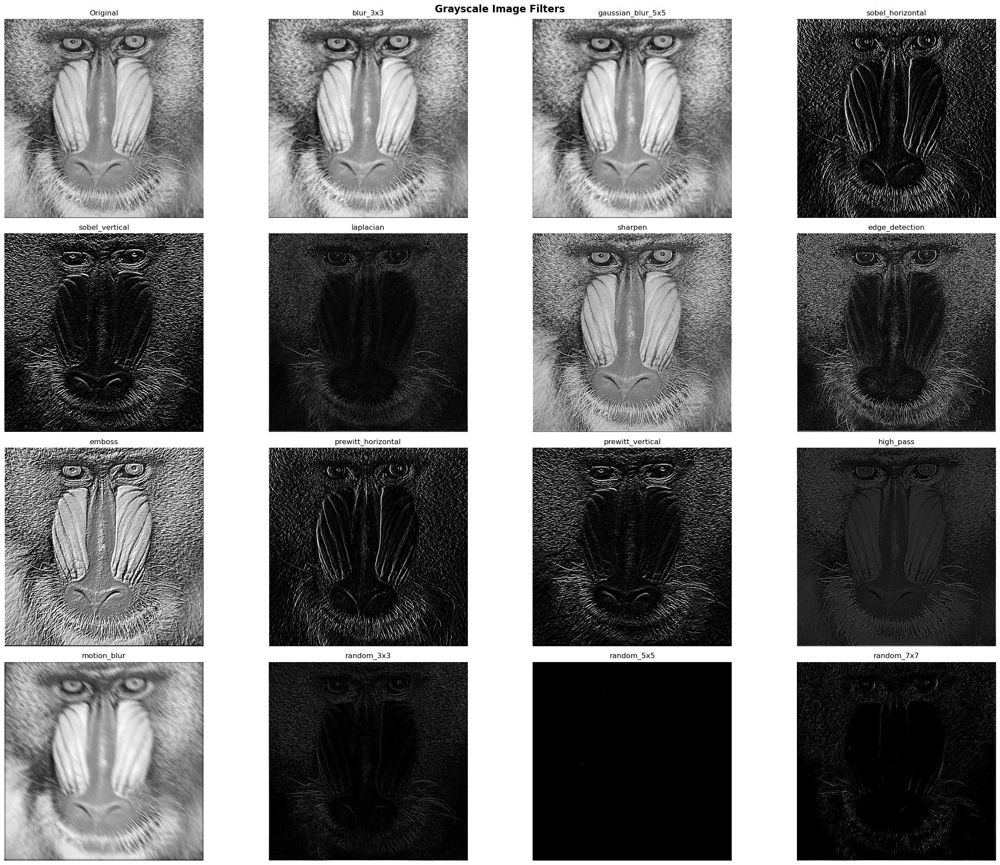

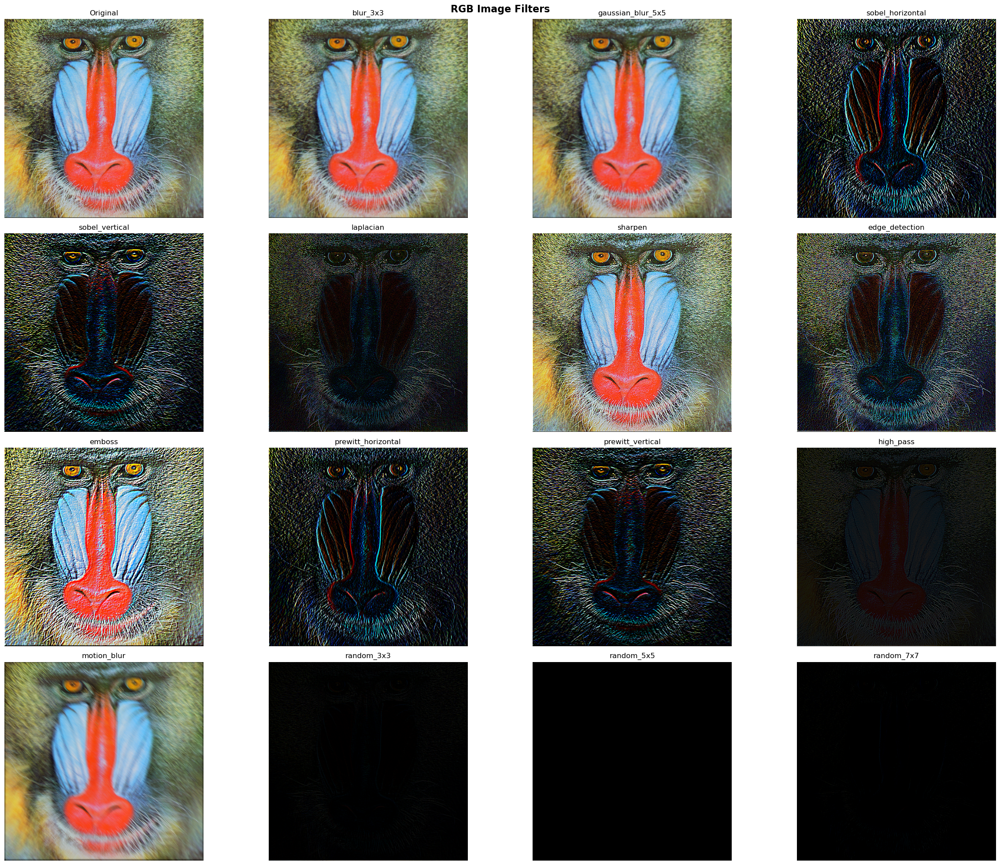


Saving results...
Saved: gray_Original.jpg
Saved: gray_blur_3x3.jpg
Saved: gray_gaussian_blur_5x5.jpg
Saved: gray_sobel_horizontal.jpg
Saved: gray_sobel_vertical.jpg
Saved: gray_laplacian.jpg
Saved: gray_sharpen.jpg
Saved: gray_edge_detection.jpg
Saved: gray_emboss.jpg
Saved: gray_prewitt_horizontal.jpg
Saved: gray_prewitt_vertical.jpg
Saved: gray_high_pass.jpg
Saved: gray_motion_blur.jpg
Saved: gray_random_3x3.jpg
Saved: gray_random_5x5.jpg
Saved: gray_random_7x7.jpg
Saved: rgb_Original.jpg
Saved: rgb_blur_3x3.jpg
Saved: rgb_gaussian_blur_5x5.jpg
Saved: rgb_sobel_horizontal.jpg
Saved: rgb_sobel_vertical.jpg
Saved: rgb_laplacian.jpg
Saved: rgb_sharpen.jpg
Saved: rgb_edge_detection.jpg
Saved: rgb_emboss.jpg
Saved: rgb_prewitt_horizontal.jpg
Saved: rgb_prewitt_vertical.jpg
Saved: rgb_high_pass.jpg
Saved: rgb_motion_blur.jpg
Saved: rgb_random_3x3.jpg
Saved: rgb_random_5x5.jpg
Saved: rgb_random_7x7.jpg

Creating Sobel comparison...


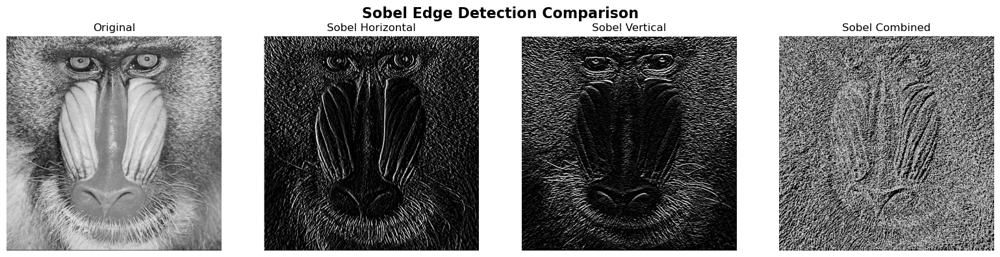

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from typing import Tuple, Optional
import requests
from io import BytesIO

# Set random seed for reproducible results
np.random.seed(42)

def download_test_image(url: str, filename: str) -> bool:
    """Download test image from URL if it doesn't exist locally"""
    if not os.path.exists(filename):
        try:
            response = requests.get(url)
            response.raise_for_status()
            with open(filename, 'wb') as f:
                f.write(response.content)
            print(f"Downloaded {filename}")
            return True
        except Exception as e:
            print(f"Failed to download {filename}: {e}")
            return False
    return True

def image_load(image_path: str, channel: int = 3) -> np.ndarray:
    """
    Load image with automatic detection of grayscale or RGB
    
    Args:
        image_path: Path to the image file
        channel: 1 for grayscale, 3 for RGB
    
    Returns:
        Loaded image as numpy array
    """
    # Check if file exists
    assert os.path.exists(image_path), f"Image file not found: {image_path}"
    
    if channel == 1:
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        assert image is not None, "Error: Unable to load grayscale image"
        assert len(image.shape) == 2, "Image should be grayscale (2D)"
    elif channel == 3:
        image = cv2.imread(image_path)
        assert image is not None, "Error: Unable to load RGB image"
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        assert len(image.shape) == 3, "Image should be RGB (3D)"
        assert image.shape[2] == 3, "RGB image should have 3 channels"
    else:
        raise ValueError("Channel must be 1 (grayscale) or 3 (RGB)")
    
    return image

def convolve_channel(image: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    """
    Apply convolution on a single channel
    
    Args:
        image: 2D image array (single channel)
        kernel: 2D convolution kernel
    
    Returns:
        Convolved image
    """
    # Assertions for validation
    assert image.shape[0] >= kernel.shape[0], "Image too small for kernel in height"
    assert image.shape[1] >= kernel.shape[1], "Image too small for kernel in width"
    assert len(image.shape) == 2, "Image should be 2D for single channel convolution"
    assert len(kernel.shape) == 2, "Kernel should be 2D"
    
    # Dimensions
    img_height, img_width = image.shape
    kernel_height, kernel_width = kernel.shape
    pad_height, pad_width = kernel_height // 2, kernel_width // 2
    
    # Add padding to handle borders
    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)
    
    # Apply convolution
    for i in range(img_height):
        for j in range(img_width):
            region = padded_image[i:i + kernel_height, j:j + kernel_width]
            output[i, j] = np.sum(region * kernel)
    
    # Assert output dimensions
    assert output.shape == image.shape, "Output should have same dimensions as input image"
    
    return output

def apply_convolution(image: np.ndarray, kernel: np.ndarray) -> np.ndarray:
    """
    Apply convolution filter to image (supports both grayscale and RGB)
    
    Args:
        image: Input image (2D for grayscale, 3D for RGB)
        kernel: Convolution kernel (2D)
    
    Returns:
        Filtered image
    """
    # Assertions for input validation
    assert isinstance(image, np.ndarray), "Image must be a NumPy array"
    assert isinstance(kernel, np.ndarray), "Kernel must be a NumPy array"
    assert len(kernel.shape) == 2, "Kernel must be a 2D matrix"
    assert kernel.shape[0] == kernel.shape[1], "Kernel must be square"
    assert kernel.shape[0] % 2 == 1, "Kernel must have odd dimensions"
    assert len(image.shape) in [2, 3], "Image must be grayscale (2D) or RGB (3D)"
    
    if len(image.shape) == 3:  # RGB image
        assert image.shape[2] == 3, "RGB image must have 3 channels"
        height, width, channels = image.shape
        output = np.zeros_like(image, dtype=np.float32)
        
        # Apply filter to each channel
        for c in range(channels):
            output[:, :, c] = convolve_channel(image[:, :, c], kernel)
    else:  # Grayscale image
        output = convolve_channel(image, kernel)
    
    # Normalize to avoid values outside [0, 255] range
    output = np.clip(output, 0, 255).astype(np.uint8)
    
    # Assert output dimensions
    assert output.shape == image.shape, "Output should have same dimensions as input"
    
    return output

def display_images(images_dict: dict, main_title: str = "Image Filters", figsize: Tuple[int, int] = (20, 15)):
    """
    Display multiple images with filters in a single figure
    
    Args:
        images_dict: Dictionary with format {'title': image_array}
        main_title: Main title for the figure
        figsize: Figure size tuple
    """
    n_images = len(images_dict)
    cols = min(4, n_images)
    rows = (n_images + cols - 1) // cols
    
    plt.figure(figsize=figsize)
    plt.suptitle(main_title, fontsize=16, fontweight='bold')
    
    for idx, (title, image) in enumerate(images_dict.items(), 1):
        plt.subplot(rows, cols, idx)
        plt.title(title, fontsize=12)
        
        if len(image.shape) == 2:  # Grayscale
            plt.imshow(image, cmap='gray')
        else:  # RGB
            plt.imshow(image)
        
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def create_kernels():
    """Create all convolution kernels"""
    kernels = {}
    
    # 1. Blur kernel (average)
    kernels['blur_3x3'] = np.array([
        [1/9, 1/9, 1/9],
        [1/9, 1/9, 1/9],
        [1/9, 1/9, 1/9]
    ])
    
    # 2. Gaussian blur 5x5
    kernels['gaussian_blur_5x5'] = (1/256) * np.array([
        [1, 4, 6, 4, 1],
        [4, 16, 24, 16, 4],
        [6, 24, 36, 24, 6],
        [4, 16, 24, 16, 4],
        [1, 4, 6, 4, 1]
    ])
    
    # 3. Sobel horizontal (edge detection)
    kernels['sobel_horizontal'] = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ])
    
    # 4. Sobel vertical (edge detection)
    kernels['sobel_vertical'] = np.array([
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]
    ])
    
    # 5. Laplacian (edge detection)
    kernels['laplacian'] = np.array([
        [0, -1, 0],
        [-1, 4, -1],
        [0, -1, 0]
    ])
    
    # 6. Sharpen filter
    kernels['sharpen'] = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ])
    
    # 7. Edge detection (general)
    kernels['edge_detection'] = np.array([
        [-1, -1, -1],
        [-1, 8, -1],
        [-1, -1, -1]
    ])
    
    # 8. Emboss filter
    kernels['emboss'] = np.array([
        [-2, -1, 0],
        [-1, 1, 1],
        [0, 1, 2]
    ])
    
    # 9. Prewitt horizontal
    kernels['prewitt_horizontal'] = np.array([
        [-1, 0, 1],
        [-1, 0, 1],
        [-1, 0, 1]
    ])
    
    # 10. Prewitt vertical
    kernels['prewitt_vertical'] = np.array([
        [-1, -1, -1],
        [0, 0, 0],
        [1, 1, 1]
    ])
    
    # 11. High-pass filter
    kernels['high_pass'] = np.array([
        [-1, -1, -1],
        [-1, 9, -1],
        [-1, -1, -1]
    ]) / 9
    
    # 12. Motion blur
    kernels['motion_blur'] = np.zeros((9, 9))
    np.fill_diagonal(kernels['motion_blur'], 1/9)
    
    # 13-15. Random filters with different sizes
    kernels['random_3x3'] = np.random.uniform(-1, 1, (3, 3))
    kernels['random_5x5'] = np.random.uniform(-1, 1, (5, 5))
    kernels['random_7x7'] = np.random.uniform(-1, 1, (7, 7))
    
    # Normalize random kernels
    for key in ['random_3x3', 'random_5x5', 'random_7x7']:
        kernels[key] = kernels[key] / np.sum(np.abs(kernels[key]))
    
    return kernels

def save_results(images_dict: dict, prefix: str = ""):
    """Save filtered images to files"""
    for name, image in images_dict.items():
        filename = f"{prefix}_{name}.jpg" if prefix else f"{name}.jpg"
        
        if len(image.shape) == 3:  # RGB
            # Convert RGB to BGR for OpenCV
            image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            cv2.imwrite(filename, image_bgr)
        else:  # Grayscale
            cv2.imwrite(filename, image)
        
        print(f"Saved: {filename}")

def analyze_kernel_effects(kernels: dict):
    """Print analysis of different kernels"""
    print("\n" + "="*60)
    print("KERNEL ANALYSIS")
    print("="*60)
    
    for name, kernel in kernels.items():
        print(f"\n{name.upper()}:")
        print(f"  Size: {kernel.shape}")
        print(f"  Sum: {np.sum(kernel):.3f}")
        print(f"  Effect: ", end="")
        
        kernel_sum = np.sum(kernel)
        if 'blur' in name.lower() or 'gaussian' in name.lower():
            print("Smoothing/Blurring - reduces noise and details")
        elif 'sobel' in name.lower() or 'prewitt' in name.lower():
            print("Edge detection - highlights intensity changes")
        elif 'laplacian' in name.lower() or 'edge' in name.lower():
            print("Edge enhancement - emphasizes edges and boundaries")
        elif 'sharpen' in name.lower():
            print("Sharpening - enhances details and edges")
        elif 'emboss' in name.lower():
            print("Embossing - creates 3D-like effect")
        elif 'random' in name.lower():
            print("Random effect - unpredictable artistic filter")
        elif 'motion' in name.lower():
            print("Motion blur - simulates movement blur")
        else:
            print("Custom filter effect")

def main():
    """Main function to run the complete convolution filter application"""
    print("Convolution Filter Application")
    print("="*50)
    
    # Create sample image if no test images available
    test_image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/5/50/Vd-Orig.png/256px-Vd-Orig.png"
    test_image_name = "babbon.png"
    
    # Try to download test image
    if not os.path.exists(test_image_name):
        print(f"Downloading test image...")
        try:
            response = requests.get(test_image_url)
            with open(test_image_name, 'wb') as f:
                f.write(response.content)
            print(f"Test image downloaded: {test_image_name}")
        except:
            print("Could not download test image. Creating synthetic image...")
            # Create a synthetic test image
            synthetic_image = np.zeros((200, 200, 3), dtype=np.uint8)
            # Add some patterns
            synthetic_image[50:150, 50:150] = [255, 100, 100]  # Red square
            synthetic_image[75:125, 75:125] = [100, 255, 100]  # Green square
            synthetic_image[90:110, 90:110] = [100, 100, 255]  # Blue square
            # Save synthetic image
            cv2.imwrite(test_image_name, cv2.cvtColor(synthetic_image, cv2.COLOR_RGB2BGR))
            print(f"Created synthetic test image: {test_image_name}")
    
    # Load images
    print(f"\nLoading images...")
    gray_image = image_load(test_image_name, channel=1)
    rgb_image = image_load(test_image_name, channel=3)
    
    print(f"Grayscale image shape: {gray_image.shape}")
    print(f"RGB image shape: {rgb_image.shape}")
    
    # Create all kernels
    print(f"\nCreating convolution kernels...")
    kernels = create_kernels()
    print(f"Created {len(kernels)} different kernels")
    
    # Analyze kernels
    analyze_kernel_effects(kernels)
    
    # Apply filters to grayscale image
    print(f"\nApplying filters to grayscale image...")
    gray_results = {'Original': gray_image}
    
    for name, kernel in kernels.items():
        try:
            filtered = apply_convolution(gray_image, kernel)
            gray_results[name] = filtered
            print(f"  ✓ Applied {name}")
        except Exception as e:
            print(f"  ✗ Failed to apply {name}: {e}")
    
    # Apply filters to RGB image
    print(f"\nApplying filters to RGB image...")
    rgb_results = {'Original': rgb_image}
    
    for name, kernel in kernels.items():
        try:
            filtered = apply_convolution(rgb_image, kernel)
            rgb_results[name] = filtered
            print(f"  ✓ Applied {name}")
        except Exception as e:
            print(f"  ✗ Failed to apply {name}: {e}")
    
    # Display results
    print(f"\nDisplaying results...")
    display_images(gray_results, "Grayscale Image Filters", figsize=(25, 20))
    display_images(rgb_results, "RGB Image Filters", figsize=(25, 20))
    
    # Save results
    print(f"\nSaving results...")
    save_results(gray_results, "gray")
    save_results(rgb_results, "rgb")
    
    # Comparison of Sobel filters
    print(f"\nCreating Sobel comparison...")
    sobel_comparison = {
        'Original': gray_image,
        'Sobel Horizontal': gray_results['sobel_horizontal'],
        'Sobel Vertical': gray_results['sobel_vertical'],
        'Sobel Combined': np.sqrt(gray_results['sobel_horizontal']**2 + gray_results['sobel_vertical']**2).astype(np.uint8)
    }
    display_images(sobel_comparison, "Sobel Edge Detection Comparison", figsize=(16, 4))
    

if __name__ == "__main__":
    main()